In [4]:
from getpass import getuser # Libaray to copy things
from pathlib import Path # Object oriented libary to deal with paths
from tempfile import NamedTemporaryFile, TemporaryDirectory # Creating temporary Files/Dirs

import xarray as xr
import numpy as np
import pandas as pd
from scipy.optimize import curve_fit
from pathlib import Path
import netCDF4 as nc

# for plot
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

import dask

/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/pyproj/__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()


# PLOTTING TOOL

In [5]:
def contf_tmean(title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max):
    proj = ccrs.PlateCarree(central_longitude=0.0) # Create Mollweide projections
    fig = plt.figure(figsize=(18, 12))
    ax = fig.add_subplot(111, projection=proj)
    ax.set_extent([lon_min+5,lon_max-5,lat_min+5,lat_max-5])
    #plot = data.where((data.lat >= lat_min) & (data.lat <= lat_max) & (data.lon >= lon_min) & (data.lon <= lon_max)).plot(
    plot = data.plot(
                      ax=ax,
                      transform=ccrs.PlateCarree(),
                      cmap=colormap,
                      vmin=varmin,
                      vmax=varmax,
                     # cbar_kwargs={'label': 'Surface Temperature [K]',
                     #              'extend': 'both',
                     #              'shrink': .5,
                     #              'orientation': 'horizontal'},
                      add_colorbar=False
                     )
    bounds = np.linspace(varmin,varmax, space)
    cb = plt.colorbar(plot, orientation="horizontal", fraction=0.08, pad=0.10, extend='both',ticks=bounds, boundaries=bounds)
    cb.set_label(label=label, size=15, weight='bold')
    cb.ax.tick_params(labelsize=15)
    cb.ax.set_xticklabels(bounds,rotation=90)
    ax.coastlines(resolution='10m', lw=0.51)
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style, gl.ylabel_style = {'fontsize': 15}, {'fontsize': 15}
    ax.yaxis.tick_right() 
    ax.set_title(title, fontsize=16, weight='bold')
    _ = fig.subplots_adjust(left=0.01, right=0.98, hspace=0, wspace=0, top=0.9, bottom=0.25)

# Precipitation

## Load interpolated ICON results

In [6]:
path_icon =Path('/scratch/m/m300948/test_04/')
glob_pattern = 'test_daily_pr_2020'
file_icon = sorted([str(f) for f in path_icon.glob(f'{glob_pattern}*.nc')])[:]

In [7]:
var = 'pr'
dset_icon = xr.open_mfdataset(file_icon,parallel=True)[var].chunk({'time':24})

In [8]:
dset_icon

<xarray.DataArray 'pr' (time: 63, lat: 600, lon: 3600)>
dask.array<rechunk-merge, shape=(63, 600, 3600), dtype=float32, chunksize=(24, 600, 3600), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-03-22
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95

## Load IMERGE 

### Loading IMERGE for every time takes a lot of time, so save ncfile at initial point

#### 1. save ncfile for daily basis at the initial step - /work/mh0731/from_Mistral/mh0731/m300876/precip_paper/data/obs/IMERG

In [9]:
def halfhourly_to_daily(year,month):
    glob_pattern_3d1 = 'IMERG_precipitationrate__V06B__halfhourly__0.1degree__'+ year+month
    data_path1 = Path('/pool/data/ICDC/atmosphere/imerg/DATA/' + year)
    file_names1 = sorted([str(f) for f in data_path1.rglob(f'*{glob_pattern_3d1}*.nc')])[:]
    pr_imerg  = xr.open_mfdataset(file_names1,engine='netcdf4',combine='by_coords').sel(lat=slice(-30,30))
    pr_imerg_day = pr_imerg['calibrated_precipitation'].chunk({'time':144}).resample(time='1D').sum() /2
    pr_imerg_day.to_netcdf('/scratch/m/m300876/data/imerg/IMERG_precipitationrate_V06B_daily_0.1degree_tropics_30S_30N_'+year+month+'.nc', format = 'NETCDF4', mode ='w', group=None)
    #pr_imerg_day_trop.to_netcdf('/work/mh0731/m300876/precip_paper/data/obs/IMERG/IMERG_precipitationrate_V06B_daily_0.1degree_tropics_30S_30N_'+year+'.nc', format = 'NETCDF4', mode ='w', group=None)
    return print('work done')

In [ ]:
##running
halfhourly_to_daily('2021','01')

KeyboardInterrupt: 

#### 2. load IMERGE for everytime when I run this script (unefficient)

In [ ]:
path_imerg =Path('/pool/data/ICDC/atmosphere/imerg/DATA/2020')
glob_pattern = 'IMERG_precipitationrate__V06B__halfhourly__0.1degree__2020'
file_img = sorted([str(f) for f in path_imerg.glob(f'{glob_pattern}*.nc')])[:]

In [ ]:
# 2020.01.20.00:00 - 2020.03.31.23:30 24*182-1
file_img_date=file_img[24*38:24*182-1]
var = 'calibrated_precipitation'

# dask: not actually upload data, but shows the information of the data and get chucks which enable to calculate parallely
# for open_mfdataset, it needs dask 
# dsetvar = xr.open_mfdataset(file_img_date,parallel=True)[var] #default= by_coords, otherwise "nested" (but in case of nested, you need to indicate 'concat_dim')
# As a default, it chunks the data following different criteria (here since data is aligned with time, it chunks according to the time), but it will be the best to chunk the data which is not (or less) modified
dset_imerge = xr.open_mfdataset(file_img_date,parallel=True)[var].chunk({'lon':100,'time':-1}) #in case the default setting has a lot of chucks, it is wise to set chunk time // time:-1 (removing chunk)

# after modifying data, if I want to upload in real then use [].load() 

KeyboardInterrupt: 

In [ ]:
# in total, the real data has 83.4GiB, which is nearly 80% for the total amount of the data storage assigned to this jupyter.note
dset_imerge

#### 3. Load imerge of previously saved ncfile

In [10]:
# imerge for daily basis
file_img = '/work/mh0731/from_Mistral/mh0731/m300876/precip_paper/data/obs/IMERG/IMERG_precipitationrate_V06B_daily_0.1degree_tropics_30S_30N_2020.nc'
dset_img = xr.open_dataset(file_img)

In [11]:
dset_img

<xarray.Dataset>
Dimensions:                   (time: 366, lat: 600, lon: 3600)
Coordinates:
  * time                      (time) datetime64[ns] 2020-01-01 ... 2020-12-31
  * lat                       (lat) float32 -29.95 -29.85 -29.75 ... 29.85 29.95
  * lon                       (lon) float32 -179.9 -179.8 -179.8 ... 179.8 179.9
Data variables:
    calibrated_precipitation  (time, lat, lon) float32 ...

In [12]:
# select time range
dset_img_jfm = dset_img.sel(
    time=slice('2020-01-20', '2020-03-31'))

In [13]:
dset_img_jfm

<xarray.Dataset>
Dimensions:                   (time: 72, lat: 600, lon: 3600)
Coordinates:
  * time                      (time) datetime64[ns] 2020-01-20 ... 2020-03-31
  * lat                       (lat) float32 -29.95 -29.85 -29.75 ... 29.85 29.95
  * lon                       (lon) float32 -179.9 -179.8 -179.8 ... 179.8 179.9
Data variables:
    calibrated_precipitation  (time, lat, lon) float32 ...

## ICON/IMERGE Select region (lat, lon)

### 1. temporal averaged

In [14]:
# indicate only necessary command
dset_icon.sel(lat=slice(-30,30)).resample(time='1D')

DataArrayResample, grouped over '__resample_dim__'
63 groups with labels 2020-01-20, ..., 2020-03-22.

In [15]:
dset_icon

<xarray.DataArray 'pr' (time: 63, lat: 600, lon: 3600)>
dask.array<rechunk-merge, shape=(63, 600, 3600), dtype=float32, chunksize=(24, 600, 3600), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-03-22
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95

In [16]:
%time icon_timavg = dset_icon .mean("time").compute() # %time : show how much time takes for the uploading

CPU times: user 342 ms, sys: 497 ms, total: 839 ms
Wall time: 2.32 s


In [17]:
%time imerge_timavg = dset_img_jfm.mean("time").compute()

CPU times: user 171 ms, sys: 425 ms, total: 596 ms
Wall time: 716 ms


In [18]:
imerge_timavg

<xarray.Dataset>
Dimensions:                   (lat: 600, lon: 3600)
Coordinates:
  * lat                       (lat) float32 -29.95 -29.85 -29.75 ... 29.85 29.95
  * lon                       (lon) float32 -179.9 -179.8 -179.8 ... 179.8 179.9
Data variables:
    calibrated_precipitation  (lat, lon) float32 2.679 2.785 ... 3.62 3.759

In [19]:
icon_timavg = icon_timavg*3600*24

In [20]:
icon_timavg

<xarray.DataArray 'pr' (lat: 600, lon: 3600)>
array([[5.561203 , 6.7200747, 7.1798124, ..., 6.1530437, 6.485031 ,
        5.6174226],
       [4.308874 , 4.1408553, 5.2862043, ..., 6.303267 , 5.2154884,
        4.496258 ],
       [4.0218196, 4.2407165, 4.885156 , ..., 5.79294  , 3.8553247,
        3.551098 ],
       ...,
       [6.164524 , 5.9878297, 5.7744627, ..., 5.828713 , 6.040825 ,
        5.8625817],
       [5.7409277, 5.976223 , 5.8023067, ..., 6.6239033, 6.036933 ,
        5.675356 ],
       [6.374904 , 6.3460197, 6.1783204, ..., 6.36098  , 6.4535923,
        6.316288 ]], dtype=float32)
Coordinates:
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95

In [21]:
# extract dataarray from the xarray first
imerge_timavg_data=imerge_timavg['calibrated_precipitation']

### +) Monthly time average - save them for monthly mean

In [22]:
icon_timavg_mon = dset_icon.resample(time='1M').mean("time")

In [23]:
icon_timavg_mon = icon_timavg_mon*3600*24

In [24]:
imerge_timavg_mon = dset_img_jfm.resample(time='1M').mean("time")
imerge_timavg_mon_data=imerge_timavg_mon['calibrated_precipitation']

### 2. Spatial averaged

In [25]:
# Whole tropical region
icon_spaiavg = dset_icon.mean(("lon", "lat"))
imerge_spaiavg = dset_img_jfm.mean(("lon", "lat"))

In [26]:
# Whole tropical region
icon_spaiavg_amz = dset_icon.sel(lon=slice(-65,-55), lat=slice(-10,0)).mean(("lon", "lat"))
imerge_spaiavg_amz = dset_img_jfm.sel(lon=slice(-65,-55), lat=slice(-10,0)).mean(("lon", "lat"))

In [27]:
icon_spaiavg = icon_spaiavg*3600*24

In [28]:
icon_spaiavg_amz = icon_spaiavg_amz*3600*24

In [29]:
# extract dataarray from the xarray first
imerge_spaiavg_data=imerge_spaiavg['calibrated_precipitation']

In [30]:
imerge_spaiavg_data_amz=imerge_spaiavg_amz['calibrated_precipitation']

# ICON RESULT

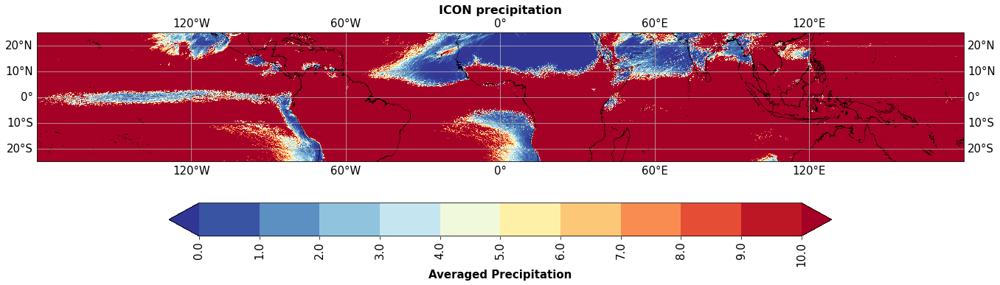

In [31]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
contf_tmean(f'ICON precipitation',icon_timavg*24,'Averaged Precipitation','RdYlBu_r',0, 10, 11,-30,30,-180,180)

In [32]:
icon_timavg_mon

<xarray.DataArray 'pr' (time: 3, lat: 600, lon: 3600)>
dask.array<mul, shape=(3, 600, 3600), dtype=float32, chunksize=(1, 600, 3600), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2020-01-31 2020-02-29 2020-03-31
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95

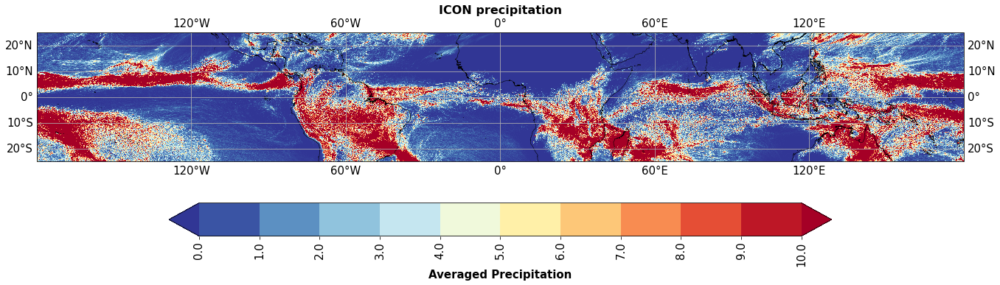

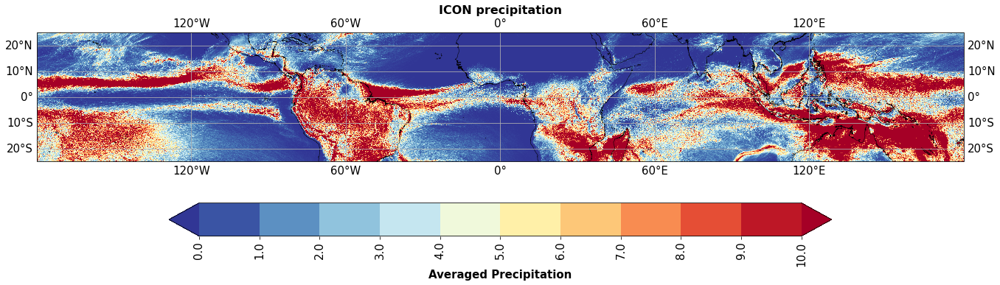

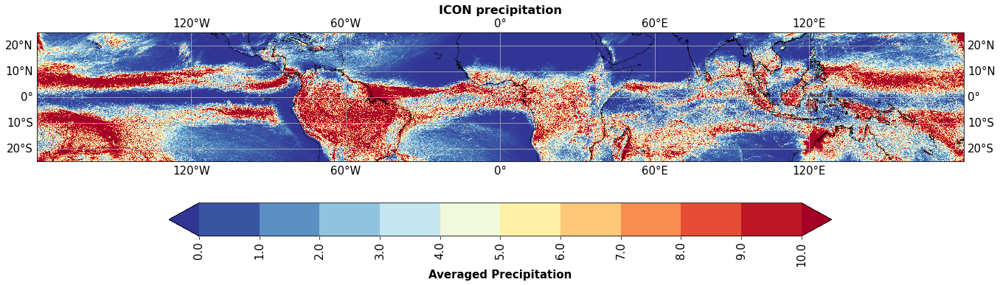

In [33]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
time_idx = ['2020-01-31T00:00:00.000000000', '2020-02-29T00:00:00.000000000',
       '2020-03-31T00:00:00.000000000']
for i in range(3):
    contf_tmean(f'ICON precipitation',icon_timavg_mon.sel(time=time_idx[i]),'Averaged Precipitation','RdYlBu_r',0, 10, 11,-30,30,-180,180)

# IMERGE RESULT

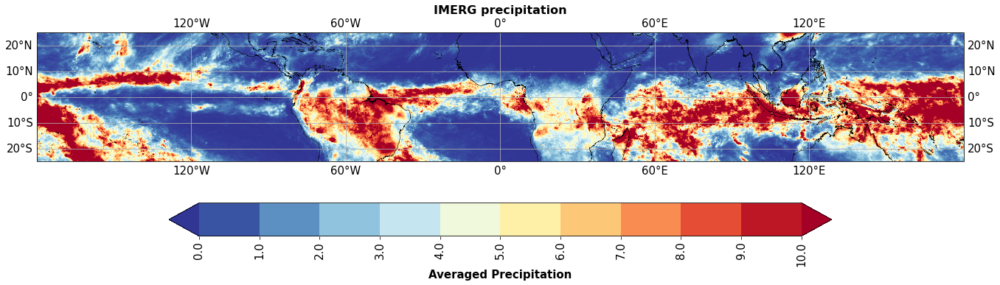

In [ ]:
contf_tmean(f'IMERG precipitation',imerge_timavg_data,'Averaged Precipitation','RdYlBu_r',0, 10, 11,-30,30,-180,180)

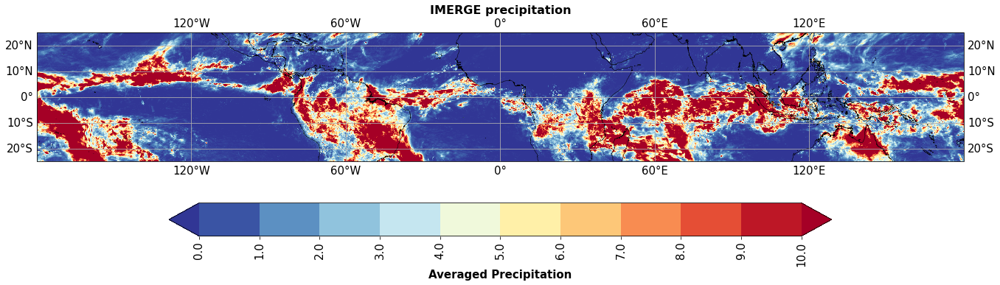

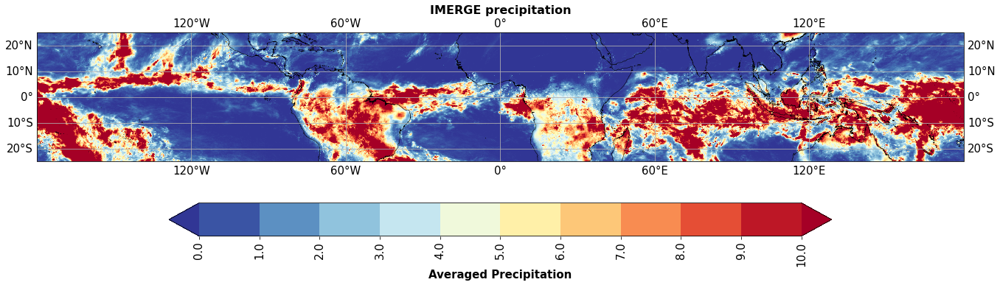

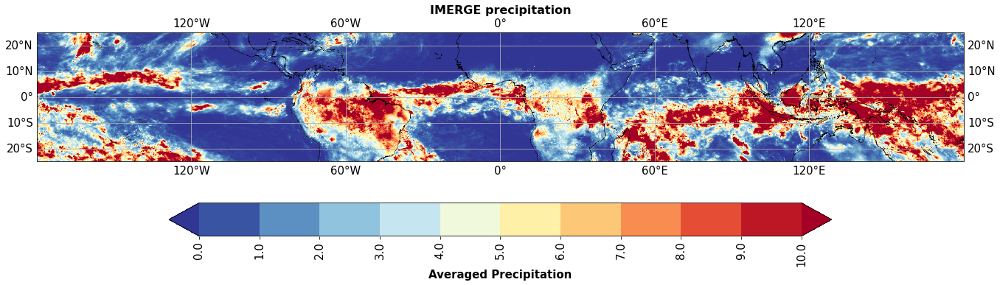

In [34]:
time_idx = ['2020-01-31T00:00:00.000000000', '2020-02-29T00:00:00.000000000',
       '2020-03-31T00:00:00.000000000']
for i in range(3):
    contf_tmean(f'IMERGE precipitation',imerge_timavg_mon_data.sel(time=time_idx[i]),'Averaged Precipitation','RdYlBu_r',0, 10, 11,-30,30,-180,180)

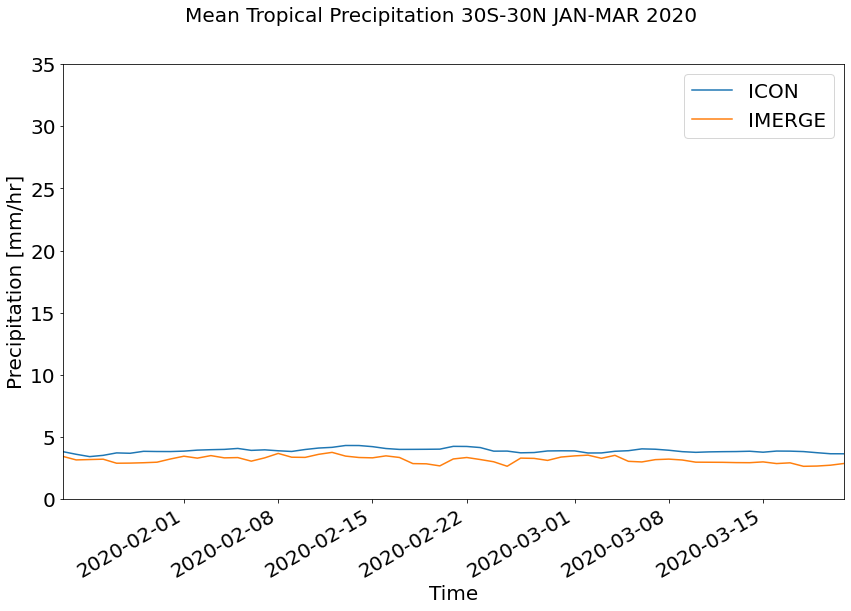

In [ ]:
fig = plt.figure(figsize=(14,8))
fig.suptitle('Mean Tropical Precipitation 30S-30N JAN-MAR 2020', size=20)
icon_spaiavg.plot.line(label="ICON")
imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('Precipitation [mm/hr]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.xlim([datetime.date(2020, 1, 23),datetime.date(2020, 3, 21)])
plt.ylim(0,35)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

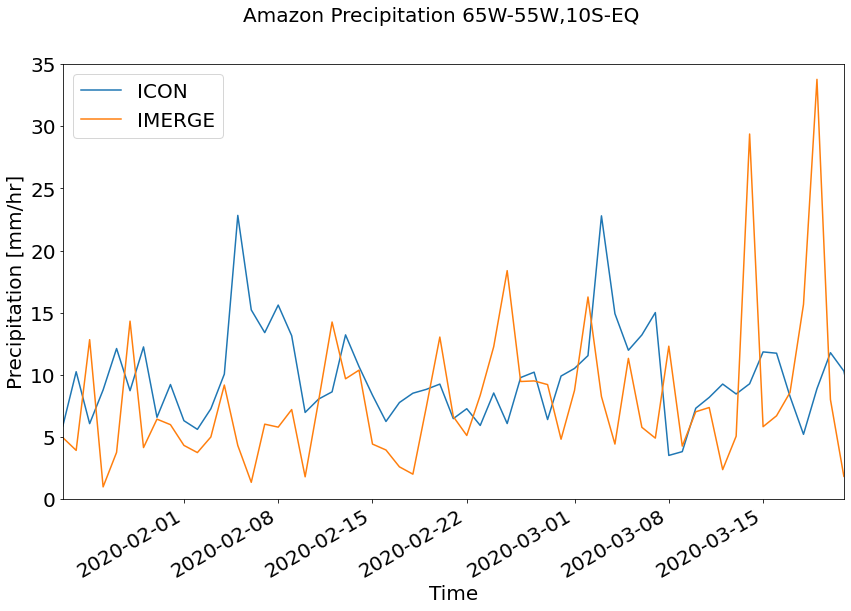

In [ ]:
fig = plt.figure(figsize=(14,8))
fig.suptitle('Amazon Precipitation 65W-55W,10S-EQ', size=20)
icon_spaiavg_amz.plot.line(label="ICON")
imerge_spaiavg_data_amz.plot.line(label="IMERGE")
plt.ylabel('Precipitation [mm/hr]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.xlim([datetime.date(2020, 1, 23),datetime.date(2020, 3, 21)])
plt.ylim(0,35)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

# SST plotting

## Masking file load: first, use cdo to convert ncells into lat, lon (spent too much time on this...:(!)
### 5km, 10km

In [ ]:
# 5km for input SST [ICON 5km to 10km to match the IMERGE]
file_mask_5km = '/work/mh0731/m300948/dpp_0066/bc_land_phys_regrid.nc'
dset_5km = xr.open_dataset(file_mask_5km)
var_names = ['lai_clim']
dset_mask_5km = dset_5km[var_names].persist()
dset_mask_5km

/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/xarray/coding/times.py:144: SerializationWarning: Ambiguous reference date string: 1-1-1. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0001-1-1). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)
/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/xarray/coding/times.py:673: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/xarray/core/indexing.py:423: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime

<xarray.Dataset>
Dimensions:   (time: 12, lat: 3600, lon: 7200)
Coordinates:
  * time      (time) object 0001-01-31 00:00:00 ... 0001-12-31 00:00:00
  * lon       (lon) float64 -179.9 -179.9 -179.8 -179.8 ... 179.9 180.0 180.0
  * lat       (lat) float64 -89.95 -89.9 -89.85 -89.8 ... 89.85 89.9 89.95 90.0
Data variables:
    lai_clim  (time, lat, lon) float64 ...
Attributes: (12/16)
    CDI:                          Climate Data Interface version 1.9.10 (http...
    Conventions:                  CF-1.0
    institution:                  Max Planck Institute for Meteorology
    title:                        initial surface data for JSBACH
    refyear_for_cover_types:      2015
    refyear_for_cover_fractions:  2015
    ...                           ...
    references:                   Hagemann, S. & Stacke, T. (2015): Impact of...
    cdo_openmp_thread_number:     8
    history_of_appended_files:    Mon Aug 30 12:40:34 2021: Appended file gau...
    history:                      Tue May 10 14:43:30 2022: cdo -remap,gridde...
    NCO:                          4.6.7
    CDO:                          Climate Data Operators version 1.9.10 (http...

In [ ]:
dset_5km

<xarray.Dataset>
Dimensions:               (time: 12, lon: 7200, lat: 3600)
Coordinates:
  * time                  (time) object 0001-01-31 00:00:00 ... 0001-12-31 00...
  * lon                   (lon) float64 -179.9 -179.9 -179.8 ... 180.0 180.0
  * lat                   (lat) float64 -89.95 -89.9 -89.85 ... 89.9 89.95 90.0
Data variables:
    lai_clim              (time, lat, lon) float64 ...
    veg_fract             (time, lat, lon) float64 ...
    roughness_length      (lat, lon) float64 ...
    roughness_length_oro  (lat, lon) float64 ...
    albedo                (lat, lon) float64 ...
    albedo_veg_vis        (lat, lon) float64 ...
    albedo_veg_nir        (lat, lon) float64 ...
    albedo_soil_vis       (lat, lon) float64 ...
    albedo_soil_nir       (lat, lon) float64 ...
    forest_fract          (lat, lon) float64 ...
Attributes: (12/16)
    CDI:                          Climate Data Interface version 1.9.10 (http...
    Conventions:                  CF-1.0
    institution:                  Max Planck Institute for Meteorology
    title:                        initial surface data for JSBACH
    refyear_for_cover_types:      2015
    refyear_for_cover_fractions:  2015
    ...                           ...
    references:                   Hagemann, S. & Stacke, T. (2015): Impact of...
    cdo_openmp_thread_number:     8
    history_of_appended_files:    Mon Aug 30 12:40:34 2021: Appended file gau...
    history:                      Tue May 10 14:43:30 2022: cdo -remap,gridde...
    NCO:                          4.6.7
    CDO:                          Climate Data Operators version 1.9.10 (http...

In [ ]:
# 10km for output SST [ICON 5km to 10km to match the IMERGE]
file_mask_10km = '/work/mh0731/m300948/dpp_0066/bc_land_phys_regrid_1x1.nc'
dset_nc_10km = nc.Dataset(file_mask_10km, mode='r')

# convert nc.dataset to xr.dataset
dset_xr_10km = xr.open_dataset(xr.backends.NetCDF4DataStore(dset_nc_10km))

/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/xarray/coding/times.py:144: SerializationWarning: Ambiguous reference date string: 1-1-1. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0001-1-1). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)
/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/xarray/coding/times.py:673: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/xarray/core/indexing.py:423: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime

In [ ]:
dset_mask_5km=dset_mask_5km.sel(lat=slice(-30,30))

In [ ]:
dset_mask_10km=dset_xr_10km.sel(lat=slice(-30,30))

In [ ]:
dset_mask_5km=dset_mask_5km['lai_clim']

In [ ]:
dset_mask_10km=dset_mask_10km['lai_clim']

In [ ]:
# nan to 100 ==> reference data to mask the other dataset
dset_mask_5km=dset_mask_5km.fillna(100)

In [ ]:
dset_mask_10km=dset_mask_10km.fillna(100)

In [ ]:
dset_mask_10km

<xarray.DataArray 'lai_clim' (time: 12, lat: 600, lon: 3600)>
array([[[100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        ...,
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.]],

       [[100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        ...,
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.]],

       [[100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        ...,
...
        ...,
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.]],

       [[100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        ...,
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.]],

       [[100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        ...,
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.],
        [100., 100., 100., ..., 100., 100., 100.]]])
Coordinates:
  * time     (time) object 0001-01-31 00:00:00 ... 0001-12-31 00:00:00
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95
Attributes:
    long_name:  leaf area index
    units:

## 1) SST input (5KM)

In [ ]:
file_sst_in = '/work/mh0731/m300948/AMDEF/SST/modified_test_regrid.nc'
dset_sst_in = xr.open_dataset(file_sst_in) # if it is ncfile
var_names = ['tosbcs']
subset_sst_in = dset_sst_in[var_names].persist()
subset_sst_in

<xarray.Dataset>
Dimensions:  (time: 12, lat: 3600, lon: 7200)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-16T12:00:00 ... 2020-12-16T12:00:00
  * lon      (lon) float64 -179.9 -179.9 -179.8 -179.8 ... 179.9 180.0 180.0
  * lat      (lat) float64 -89.95 -89.9 -89.85 -89.8 ... 89.85 89.9 89.95 90.0
Data variables:
    tosbcs   (time, lat, lon) float32 ...
Attributes: (12/35)
    CDI:                     Climate Data Interface version 1.9.10 (https://m...
    source:                  PCMDI-AMIP 1.1.2: Merged SST based on UK MetOffi...
    institution:             Program for Climate Model Diagnosis and Intercom...
    Conventions:             CF-1.7 CMIP-6.0
    history:                 Mon Jun 06 15:21:01 2022: cdo -remap,griddes_05x...
    activity_id:             input4MIPs
    ...                      ...
    title:                   PCMDI-AMIP 1.1.2 dataset prepared for input4MIPs
    tracking_id:             47a09332-8f0e-4d97-9ba4-c437c14cf89c
    variable_id:             tosbcs
    license:                 AMIP boundary condition data produced by PCMDI i...
    cmor_version:            3.2.3
    CDO:                     Climate Data Operators version 1.9.10 (https://m...

In [ ]:
subset_sst_in=subset_sst_in.sel(lat=slice(-30,30))
sst_input=subset_sst_in['tosbcs']

In [ ]:
sst_input

<xarray.DataArray 'tosbcs' (time: 12, lat: 1201, lon: 7200)>
[103766400 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 2020-01-16T12:00:00 ... 2020-12-16T12:00:00
  * lon      (lon) float64 -179.9 -179.9 -179.8 -179.8 ... 179.9 180.0 180.0
  * lat      (lat) float64 -30.0 -29.95 -29.9 -29.85 ... 29.85 29.9 29.95 30.0
Attributes:
    standard_name:  sea_surface_temperature
    long_name:      Constructed mid-month Sea Surface Temperature
    units:          degC
    cell_methods:   time: point
    cell_measures:  area: areacello

In [ ]:
# mask 'sst_input' with 'dset_mask'
sst_input_mask=sst_input.where(dset_mask_5km.isel(time=0)==100,np.nan)

### total average (1 value)

In [ ]:
# average the whole tropical area
#sst_input_tavg = sst_input.sel(time=slice('2020-01-16T12:00:00.000000000','2020-04-16T12:00:00.000000000')).mean(("time","lat","lon"))

# average only for the ocean
sst_input_tavg_ocn = sst_input.where(dset_mask_5km.isel(time=0)==100).sel(time=slice('2020-01-16T12:00:00.000000000','2020-04-16T12:00:00.000000000')).mean(("time","lat","lon"))

In [ ]:
#print(sst_input_tavg)
print(sst_input_tavg_ocn)

<xarray.DataArray 'tosbcs' ()>
array(299.46225, dtype=float32)


In [ ]:
sst_input_time_avg=sst_input.sel(time=slice('2020-01-16T12:00:00.000000000','2020-04-16T12:00:00.000000000')).mean("time")

In [ ]:
sst_input_time_avg

<xarray.DataArray 'tosbcs' (lat: 1201, lon: 7200)>
array([[296.3946 , 296.3942 , 296.3946 , ..., 296.39453, 296.39423,
        296.3946 ],
       [296.40988, 296.4116 , 296.41165, ..., 296.41315, 296.40967,
        296.40866],
       [296.42505, 296.42587, 296.42752, ..., 296.4267 , 296.4257 ,
        296.4255 ],
       ...,
       [291.8302 , 291.8303 , 291.83124, ..., 291.837  , 291.8339 ,
        291.83212],
       [291.80588, 291.80743, 291.8061 , ..., 291.8152 , 291.80823,
        291.80505],
       [291.78128, 291.77948, 291.77878, ..., 291.78528, 291.78357,
        291.78247]], dtype=float32)
Coordinates:
  * lon      (lon) float64 -179.9 -179.9 -179.8 -179.8 ... 179.9 180.0 180.0
  * lat      (lat) float64 -30.0 -29.95 -29.9 -29.85 ... 29.85 29.9 29.95 30.0

In [ ]:
# mask 'sst_input' with 'dset_mask'
sst_input_time_avg_mask=sst_input_time_avg.where(dset_mask_5km.isel(time=0)==100,np.nan)

## Plot SST

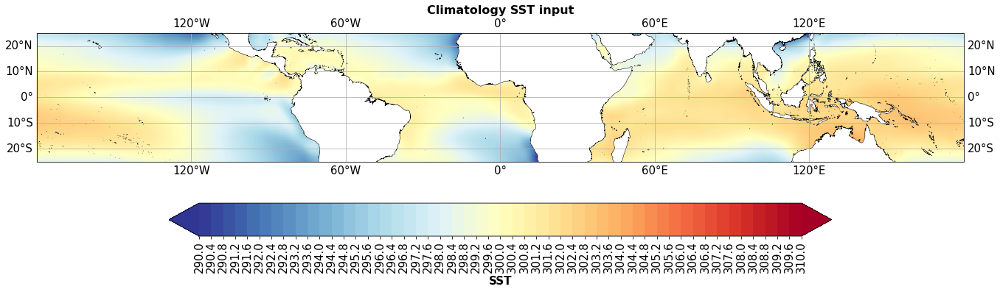

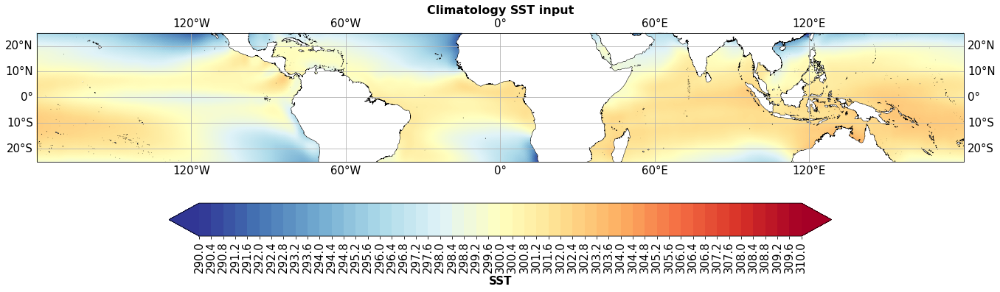

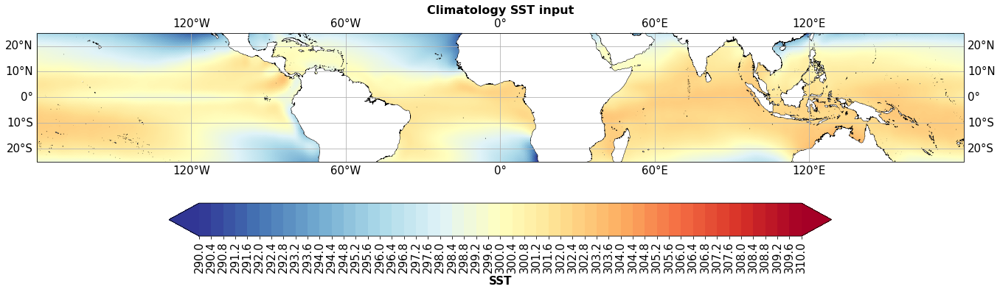

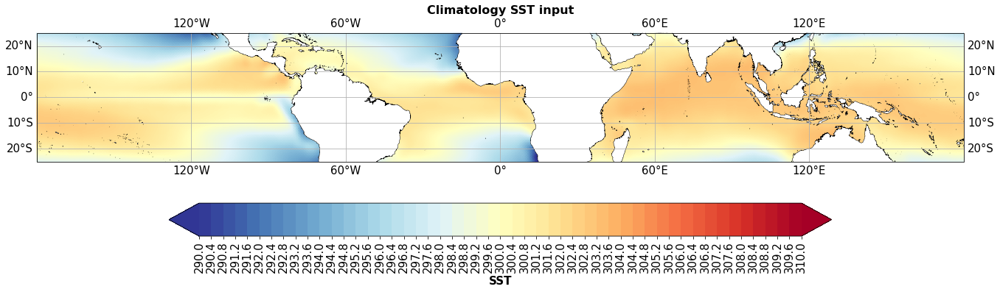

In [ ]:
time_idx = ['2020-01-16T12:00:00.000000000', '2020-02-15T12:00:00.000000000',
       '2020-03-16T12:00:00.000000000','2020-04-16T00:00:00.000000000']
for i in range(4):   
    contf_tmean(f'Climatology SST input',sst_input_mask.sel(time=time_idx[i]),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

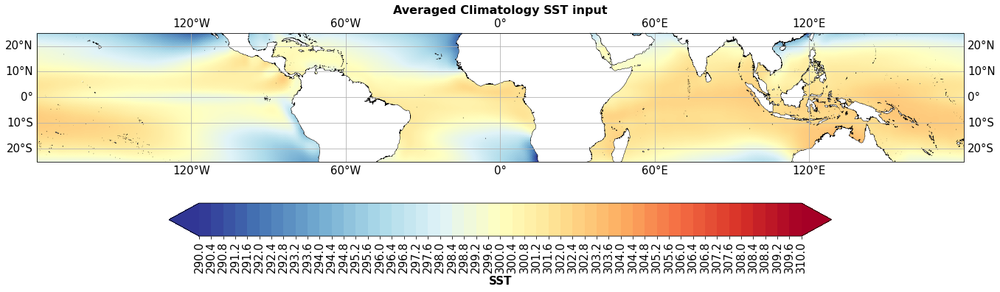

In [ ]:
contf_tmean(f'Averaged Climatology SST input',sst_input_time_avg_mask,'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

In [ ]:
a=sst_input_time_avg-sst_input_tavg
print(a.max())
print(a.min())

<xarray.DataArray 'tosbcs' ()>
array(19.563477, dtype=float32)
<xarray.DataArray 'tosbcs' ()>
array(-17.339142, dtype=float32)


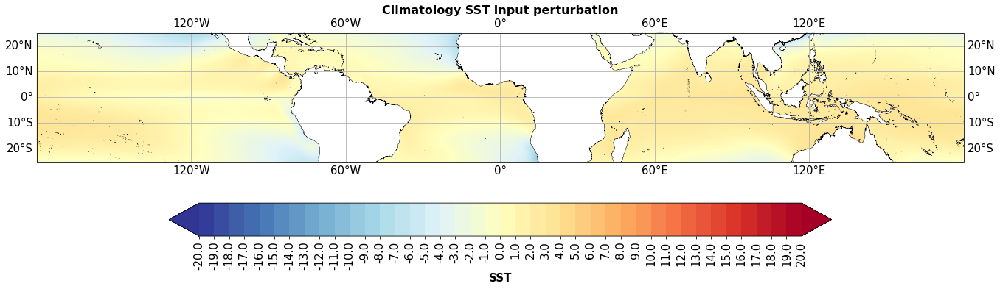

In [ ]:
contf_tmean(f'Climatology SST input perturbation',sst_input_time_avg_mask-sst_input_tavg_ocn,'SST','RdYlBu_r',-20,20, 41,-30,30,-180,180)

## 2) SST output + Surface temperature (10KM)

In [ ]:
# ts
path_icon =Path('/scratch/m/m300948/test_04/')
glob_pattern = 'test_daily_ts_2020'
file_icon = sorted([str(f) for f in path_icon.glob(f'{glob_pattern}*.nc')])[:]
var = 'ts'
sst_icon = xr.open_mfdataset(file_icon,parallel=True)[var].chunk({'time':24})

In [ ]:
# TIME AVERAGE
sst_icon=sst_icon.sel(lat=slice(-30,30)).resample(time='1M').mean("time")

In [ ]:
# SPATIAL AVERAGE
sst_icon=sst_icon.sel(lat=slice(-30,30))

In [ ]:
# mask 'sst_input' with 'dset_mask'
sst_icon_mask=sst_icon.where(dset_mask_10km.isel(time=0)==100,np.nan)

In [ ]:
sst_icon_mask

<xarray.DataArray 'ts' (time: 38, lat: 600, lon: 3600)>
dask.array<where, shape=(38, 600, 3600), dtype=float32, chunksize=(24, 600, 3600), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-02-29
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95

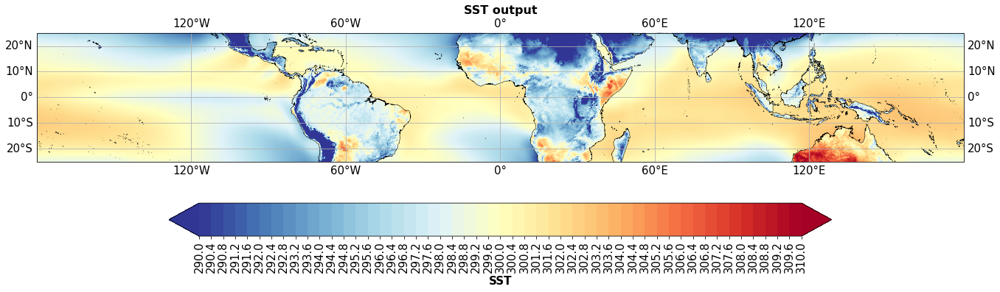

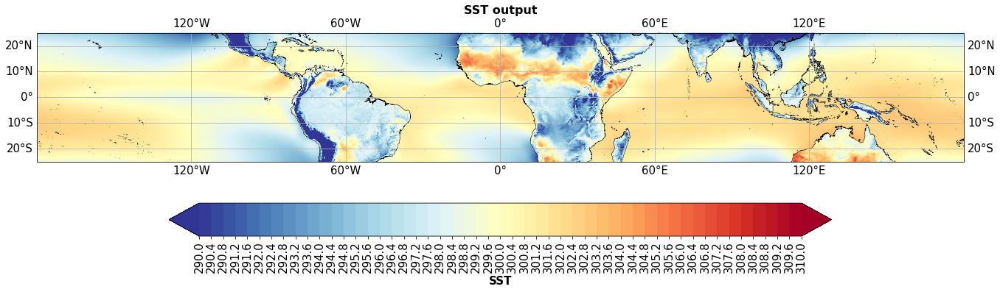

In [ ]:
time_idx = ['2020-01-31T00:00:00.000000000', '2020-02-29T00:00:00.000000000']
      #'2020-03-31T00:00:00.000000000','2020-04-30T00:00:00.000000000']
for i in range(2):   
    contf_tmean(f'SST output',sst_icon.sel(time=time_idx[i]),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

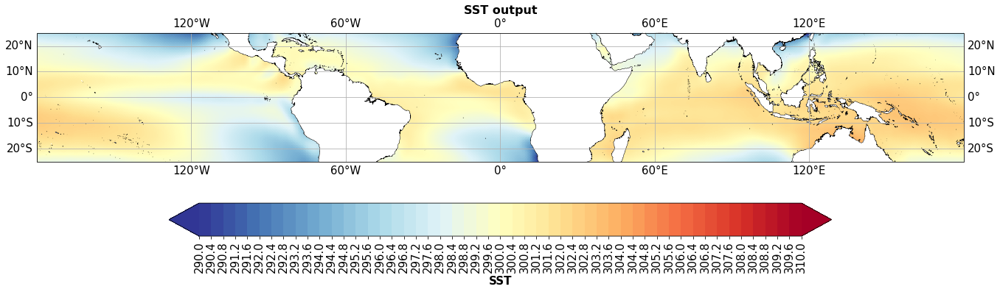

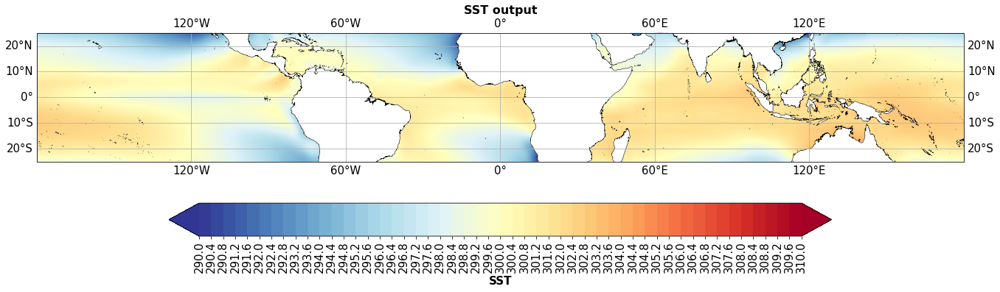

In [ ]:
for i in range(3):   
    contf_tmean(f'SST output',sst_icon_mask.isel(time=i),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

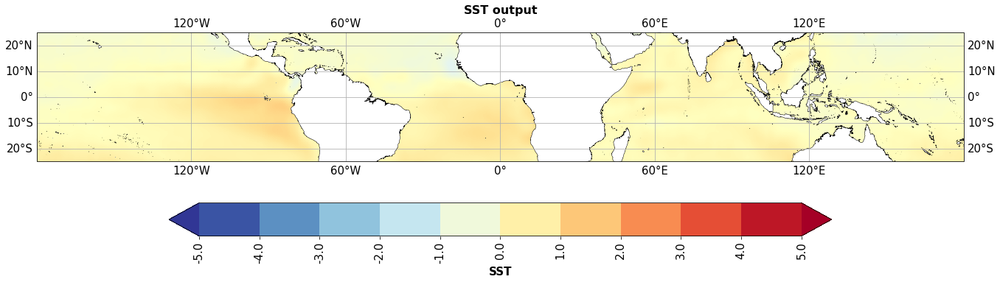

In [ ]:
contf_tmean(f'SST output',sst_icon_mask.isel(time=1)-sst_icon_mask.isel(time=0),'SST','RdYlBu_r',-5,5, 11,-30,30,-180,180)

KeyError: '2020-02-29T00:00:00.000000000'

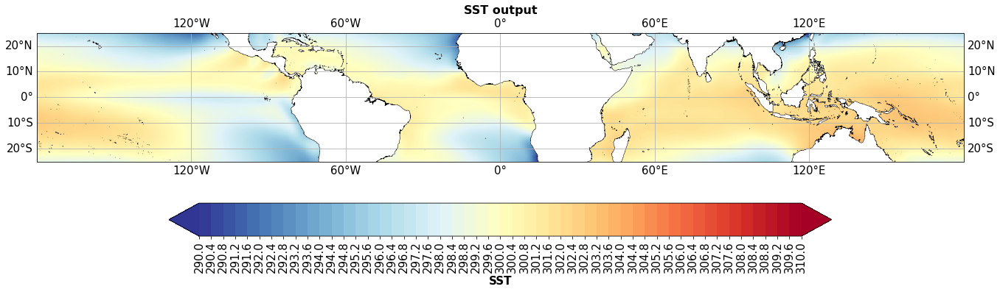

In [ ]:
time_idx = ['2020-01-31T00:00:00.000000000', '2020-02-29T00:00:00.000000000',
       '2020-03-31T00:00:00.000000000','2020-04-30T00:00:00.000000000']
for i in range(4):   
    contf_tmean(f'SST output',sst_icon_mask.sel(time=time_idx[i]),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

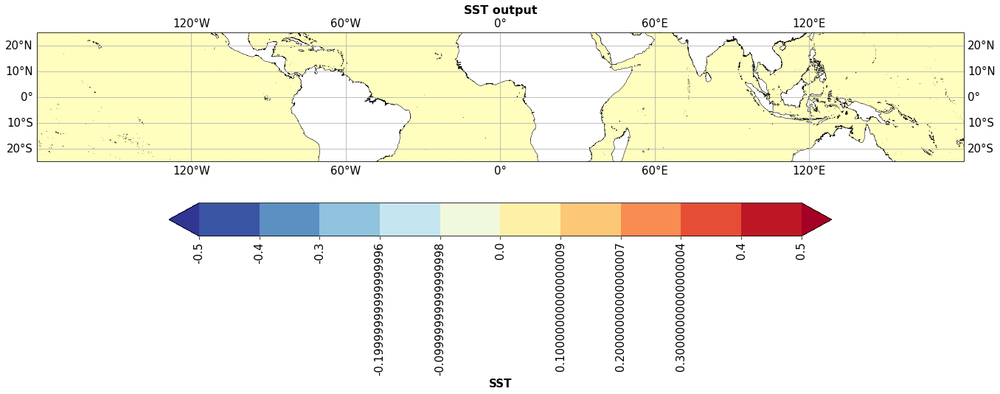

In [ ]:
contf_tmean(f'SST output',sst_icon_mask.isel(time=31)-sst_icon_mask.isel(time=0),'SST','RdYlBu_r',-0.5,0.5,11,-30,30,-180,180)

### total average (1 value) 

In [ ]:
# average only for the ocean => one value
sst_icon_tavg_ocn = sst_icon_mask.mean(("time"))

In [ ]:
sst_icon_tavg_ocn

<xarray.DataArray 'ts' (lat: 600, lon: 3600)>
dask.array<mean_agg-aggregate, shape=(600, 3600), dtype=float32, chunksize=(600, 3600), chunktype=numpy.ndarray>
Coordinates:
  * lon      (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat      (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95

In [ ]:
a=sst_icon_tavg_ocn.to_numpy()
b=np.nanmean(a, axis=(0,1))

In [ ]:
b

299.20807

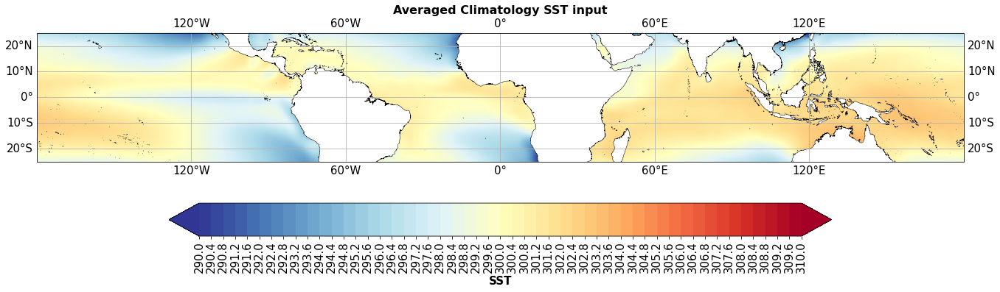

In [ ]:
contf_tmean(f'Averaged Climatology SST input',sst_icon_tavg_ocn,'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

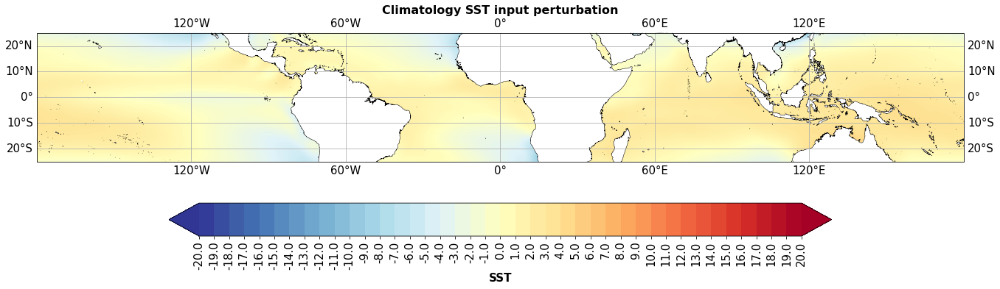

In [ ]:
contf_tmean(f'Climatology SST input perturbation',sst_icon_tavg_ocn-b,'SST','RdYlBu_r',-20,20, 41,-30,30,-180,180)

# ICON SST for the first step

In [ ]:
file_sst_rg_in = '/work/mh0731/m300948/nextgems_cycle2_1/experiments/TEST01/work/run_20200120T000000-20200120T235920/TEST01_atm_2d_ml_20200120T000000Z_regrid.nc'
dset_sst_rg_in = xr.open_dataset(file_sst_rg_in) # if it is ncfile
var_names = ['ts']
subset_sst_rg_in = dset_sst_rg_in[var_names]
subset_sst_rg_in

<xarray.Dataset>
Dimensions:  (time: 48, lat: 3600, lon: 7200)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-20 ... 2020-01-20T23:30:00
  * lon      (lon) float64 -179.9 -179.9 -179.8 -179.8 ... 179.9 180.0 180.0
  * lat      (lat) float64 -89.95 -89.9 -89.85 -89.8 ... 89.85 89.9 89.95 90.0
Data variables:
    ts       (time, lat, lon) float32 ...
Attributes:
    CDI:          Climate Data Interface version 2.0.3 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    source:       git@gitlab.dkrz.de:icon/icon-aes.git@ee0ee6518a819ff2363790...
    institution:  Max Planck Institute for Meteorology/Deutscher Wetterdienst
    title:        ICON simulation
    history:      Mon Jul 11 12:00:35 2022: cdo -remap,griddes_05x05.txt,./we...
    references:   see MPIM/DWD publications
    comment:      Arim Yoon (m300948) on l40695 (Linux 4.18.0-305.25.1.el8_4....
    CDO:          Climate Data Operators version 2.0.3 (https://mpimet.mpg.de...

In [ ]:
sst_rg_in=subset_sst_rg_in.sel(lat=slice(-30,30))

In [ ]:
# mask 'sst_input' with 'dset_mask'
sst_rg_in_mask=sst_rg_in.where(dset_mask_5km.isel(time=0)==100,np.nan)

In [ ]:
sst_rg_in_mask=sst_rg_in_mask['ts']
#sst_input=subset_sst_in['tosbcs']

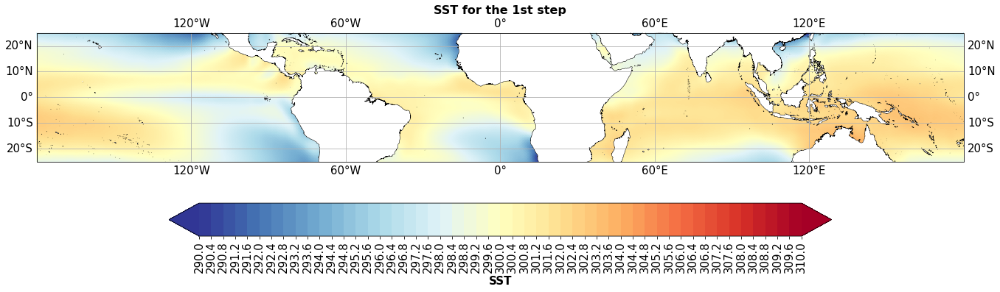

In [ ]:
contf_tmean(f'SST for the 1st step',sst_rg_in_mask.isel(time=0),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

## Test with re-regrid data

In [ ]:
new_sst_rg_in = '/work/mh0731/m300948/AMDEF/SST/new_regrid_2020.nc'
new_sst_rg_in = xr.open_dataset(new_sst_rg_in) # if it is ncfile
var_names = ['tosbcs']
new_sst_rg_in = new_sst_rg_in[var_names]
new_sst_rg_in

<xarray.Dataset>
Dimensions:  (time: 12, lat: 3600, lon: 7200)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-16T12:00:00 ... 2020-12-16T12:00:00
  * lon      (lon) float64 -179.9 -179.9 -179.8 -179.8 ... 179.9 180.0 180.0
  * lat      (lat) float64 -89.95 -89.9 -89.85 -89.8 ... 89.85 89.9 89.95 90.0
Data variables:
    tosbcs   (time, lat, lon) float32 ...
Attributes: (12/35)
    CDI:                     Climate Data Interface version 2.0.3 (https://mp...
    source:                  PCMDI-AMIP 1.1.2: Merged SST based on UK MetOffi...
    institution:             Program for Climate Model Diagnosis and Intercom...
    Conventions:             CF-1.7 CMIP-6.0
    history:                 Mon Jul 11 14:19:18 2022: cdo -remap,griddes_05x...
    activity_id:             input4MIPs
    ...                      ...
    title:                   PCMDI-AMIP 1.1.2 dataset prepared for input4MIPs
    tracking_id:             47a09332-8f0e-4d97-9ba4-c437c14cf89c
    variable_id:             tosbcs
    license:                 AMIP boundary condition data produced by PCMDI i...
    cmor_version:            3.2.3
    CDO:                     Climate Data Operators version 2.0.3 (https://mp...

In [ ]:
new_sst_rg_in=new_sst_rg_in.sel(lat=slice(-30,30))

In [ ]:
# mask 'sst_input' with 'dset_mask'
new_sst_rg_in_mask=new_sst_rg_in.where(dset_mask_5km.isel(time=0)==100,np.nan)

In [ ]:
new_sst_rg_in_mask=new_sst_rg_in_mask['tosbcs']

In [ ]:
new_sst_rg_in_mask

<xarray.DataArray 'tosbcs' (time: 12, lat: 1201, lon: 7200)>
array([[[296.2747 , 296.2733 , 296.27246, ..., 296.27826, 296.27686,
         296.27573],
        [296.28928, 296.2899 , 296.28867, ..., 296.29593, 296.29138,
         296.2891 ],
        [296.3037 , 296.30344, 296.30356, ..., 296.3088 , 296.30658,
         296.30515],
        ...,
        [292.30383, 292.3042 , 292.30542, ..., 292.30927, 292.30667,
         292.3054 ],
        [292.28125, 292.28293, 292.282  , ..., 292.28906, 292.28287,
         292.28027],
        [292.25842, 292.257  , 292.25662, ..., 292.26135, 292.25998,
         292.2593 ]],

       [[296.89816, 296.8968 , 296.896  , ..., 296.9016 , 296.90027,
         296.8992 ],
        [296.91333, 296.91403, 296.91287, ..., 296.91992, 296.9153 ,
         296.91306],
        [296.92828, 296.92813, 296.9284 , ..., 296.9333 , 296.93106,
         296.92972],
...
        [296.0247 , 296.02325, 296.02185, ..., 296.03503, 296.03082,
         296.02765],
        [296.00623, 296.006  , 296.0032 , ..., 296.0183 , 296.01126,
         296.00702],
        [295.98758, 295.98483, 295.9827 , ..., 295.99542, 295.99265,
         295.9899 ]],

       [[295.04556, 295.0444 , 295.044  , ..., 295.04807, 295.04697,
         295.04633],
        [295.06256, 295.0637 , 295.06287, ..., 295.0687 , 295.064  ,
         295.0619 ],
        [295.07935, 295.0795 , 295.0803 , ..., 295.08374, 295.08173,
         295.08063],
        ...,
        [294.24432, 294.2446 , 294.2456 , ..., 294.24963, 294.24713,
         294.24585],
        [294.22342, 294.22495, 294.22403, ..., 294.23087, 294.22504,
         294.22256],
        [294.20233, 294.201  , 294.2006 , ..., 294.20508, 294.2038 ,
         294.20316]]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-16T12:00:00 ... 2020-12-16T12:00:00
  * lon      (lon) float64 -179.9 -179.9 -179.8 -179.8 ... 179.9 180.0 180.0
  * lat      (lat) float64 -30.0 -29.95 -29.9 -29.85 ... 29.85 29.9 29.95 30.0
Attributes:
    standard_name:  sea_surface_temperature
    long_name:      Constructed mid-month Sea Surface Temperature
    units:          degC
    cell_methods:   time: point
    cell_measures:  area: areacello

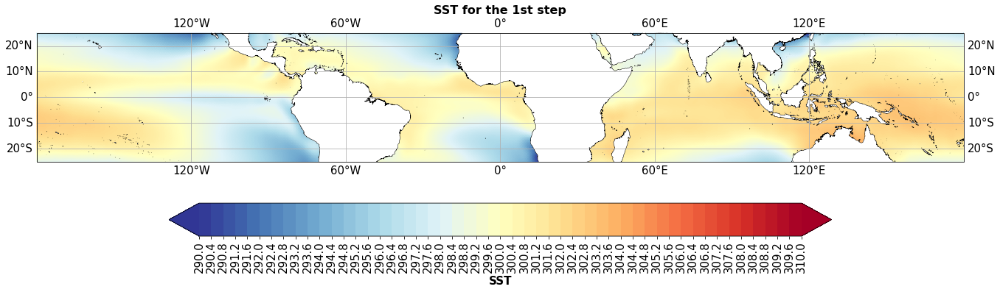

In [ ]:
contf_tmean(f'SST for the 1st step',new_sst_rg_in_mask.isel(time=0),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

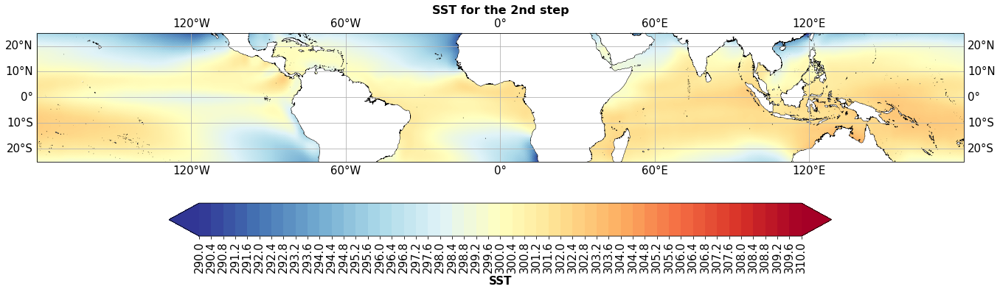

In [ ]:
contf_tmean(f'SST for the 2nd step',new_sst_rg_in_mask.isel(time=1),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

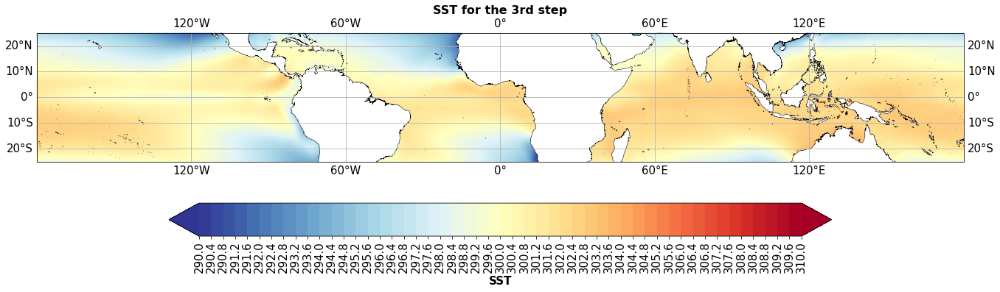

In [ ]:
contf_tmean(f'SST for the 3rd step',new_sst_rg_in_mask.isel(time=2),'SST','RdYlBu_r',290,310, 51,-30,30,-180,180)

## Time series of SST (Spatial average)

In [ ]:
sst_input

<xarray.DataArray 'tosbcs' (time: 12, lat: 1201, lon: 7200)>
[103766400 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 2020-01-16T12:00:00 ... 2020-12-16T12:00:00
  * lon      (lon) float64 -179.9 -179.9 -179.8 -179.8 ... 179.9 180.0 180.0
  * lat      (lat) float64 -30.0 -29.95 -29.9 -29.85 ... 29.85 29.9 29.95 30.0
Attributes:
    standard_name:  sea_surface_temperature
    long_name:      Constructed mid-month Sea Surface Temperature
    units:          degC
    cell_methods:   time: point
    cell_measures:  area: areacello

In [ ]:
sstin_trop_spaiavg = sst_input_mask.mean(("lon", "lat"))

In [ ]:
sstin_trop_spaiavg_1 = np.full(12,299.18793)
sstin_trop_spaiavg_2 = np.full(29,299.33652)
sstin_trop_spaiavg_final = np.concatenate((sstin_trop_spaiavg_1, sstin_trop_spaiavg_2))

In [ ]:
da

<xarray.DataArray (time: 41)>
array([299.18793, 299.18793, 299.18793, 299.18793, 299.18793, 299.18793,
       299.18793, 299.18793, 299.18793, 299.18793, 299.18793, 299.18793,
       299.33652, 299.33652, 299.33652, 299.33652, 299.33652, 299.33652,
       299.33652, 299.33652, 299.33652, 299.33652, 299.33652, 299.33652,
       299.33652, 299.33652, 299.33652, 299.33652, 299.33652, 299.33652,
       299.33652, 299.33652, 299.33652, 299.33652, 299.33652, 299.33652,
       299.33652, 299.33652, 299.33652, 299.33652, 299.33652])
Coordinates:
  * time     (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-02-29
Attributes:
    description:  SST
    units:        K

In [ ]:
sstout_trop_spaiavg = sst_icon_mask.mean(("lon", "lat"))
sstout_amz_spaiavg = sst_icon_mask.sel(lon=slice(-65,-55), lat=slice(-10,0)).mean(("lon", "lat"))

In [ ]:
time = pd.date_range("2020-01-20", periods=41)
da = xr.DataArray(
     data=sstin_trop_spaiavg_final,
     dims=["time"],
     coords=dict(
         time=time,
     ),
     attrs=dict(
         description="SST",
         units="K",
     ),
 )

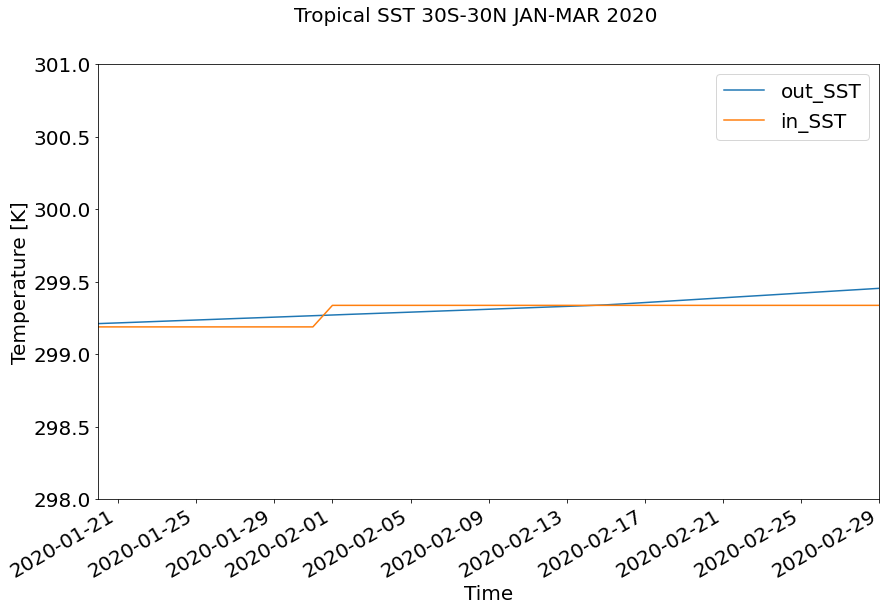

In [ ]:
import datetime
fig = plt.figure(figsize=(14,8))
fig.suptitle('Tropical SST 30S-30N JAN-MAR 2020', size=20)
sstout_trop_spaiavg[0:].plot.line(label="out_SST")
da[0:].plot.line(label="in_SST")
#plt.plot(sstin_trop_spaiavg_final[0:], label="in_SST")
#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('Temperature [K]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.ylim(298,301)
plt.xlim([datetime.date(2020, 1, 20),datetime.date(2020, 2, 29)])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

In [ ]:
import datetime
fig = plt.figure(figsize=(14,8))
fig.suptitle('Tropical Temperature 30S-30N JAN-MAR 2020', size=20)
era5_trop_spaiavg[0:].plot.line(label="ERA5_TP")
icon_trop_spaiavg[0:].plot.line(label="ICON_TP")
#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('Temperature [K]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.ylim(295,302)
plt.xlim([datetime.date(2020, 1, 23),datetime.date(2020, 3, 21)])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

# 2m Temperature

## Load interpolated ICON results

In [ ]:
path_icon =Path('/scratch/m/m300948/test_04/')
glob_pattern = 'test_daily_tas_2020'
file_icon = sorted([str(f) for f in path_icon.glob(f'{glob_pattern}*.nc')])[:61]

In [ ]:
var = 'tas'
dset_tas = xr.open_mfdataset(file_icon,parallel=True)[var].chunk({'time':24})

In [ ]:
dset_tas

<xarray.DataArray 'tas' (time: 61, height_2: 1, lat: 600, lon: 3600)>
dask.array<rechunk-merge, shape=(61, 1, 600, 3600), dtype=float32, chunksize=(24, 1, 600, 3600), chunktype=numpy.ndarray>
Coordinates:
  * time      (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-03-20
  * lon       (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat       (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95
  * height_2  (height_2) float64 2.0

### 1-1) Time average

In [ ]:
icon_timavg = dset_tas.sel(height_2=2.0).mean("time").compute() 

In [ ]:
icon_mon_timavg = dset_tas.sel(height_2=2.0).resample(time='1M').mean("time").compute() 

In [ ]:
icon_mon_timavg

<xarray.DataArray 'tas' (time: 3, lat: 600, lon: 3600)>
array([[[295.13113, 295.1388 , 295.1478 , ..., 295.11453, 295.11783,
         295.12094],
        [295.17935, 295.1907 , 295.20078, ..., 295.14865, 295.15524,
         295.16458],
        [295.22687, 295.23947, 295.2504 , ..., 295.18185, 295.1901 ,
         295.2041 ],
        ...,
        [290.5047 , 290.50812, 290.5124 , ..., 290.50955, 290.5025 ,
         290.50104],
        [290.41495, 290.42307, 290.4293 , ..., 290.41644, 290.41595,
         290.41452],
        [290.3307 , 290.33792, 290.34256, ..., 290.32803, 290.3275 ,
         290.32617]],

       [[296.49826, 296.5097 , 296.51865, ..., 296.48752, 296.48853,
         296.49014],
        [296.56012, 296.5701 , 296.57672, ..., 296.53366, 296.53836,
         296.5487 ],
        [296.6168 , 296.6205 , 296.62936, ..., 296.59283, 296.59598,
         296.60843],
...
        [290.5081 , 290.51233, 290.51926, ..., 290.52386, 290.51395,
         290.5107 ],
        [290.4377 , 290.44147, 290.44424, ..., 290.446  , 290.44202,
         290.44052],
        [290.37692, 290.38116, 290.38327, ..., 290.3657 , 290.3686 ,
         290.3722 ]],

       [[296.56024, 296.56674, 296.5677 , ..., 296.56876, 296.56522,
         296.55844],
        [296.61734, 296.6211 , 296.6211 , ..., 296.61752, 296.6118 ,
         296.61044],
        [296.6696 , 296.67242, 296.6768 , ..., 296.67078, 296.66434,
         296.66373],
        ...,
        [290.88098, 290.87457, 290.8726 , ..., 290.91058, 290.89597,
         290.8869 ],
        [290.80133, 290.79083, 290.78116, ..., 290.8267 , 290.8195 ,
         290.81128],
        [290.72083, 290.70978, 290.70053, ..., 290.74286, 290.73602,
         290.72772]]], dtype=float32)
Coordinates:
  * time      (time) datetime64[ns] 2020-01-31 2020-02-29 2020-03-31
  * lon       (lon) float64 -179.9 -179.8 -179.8 -179.6 ... 179.8 179.9 180.0
  * lat       (lat) float64 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95
    height_2  float64 2.0

### 1-2) Spatial average

In [ ]:
icon_trop_spaiavg = dset_tas.sel(height_2=2.0).mean(("lon", "lat"))
icon_amz_spaiavg = dset_tas.sel(height_2=2.0).sel(lon=slice(-65,-55), lat=slice(-10,0)).mean(("lon", "lat"))

## Load MODIS 
### Land surface temperature

In [ ]:
# Terra land surface temperature
path_terra =Path('/pool/data/ICDC/land/modis_terra_landsurfacetemperature/DATA/DAILY/2020')
glob_pattern = 'MODIS-C061__MOD11C1__DAILY__LandSurfaceTemperature__0.05deg__UHAM-ICDC__2020'
file_terra = sorted([str(f) for f in path_terra.glob(f'{glob_pattern}*.nc')])[:]

# 2020.01.20.00:00 - 2020.03.31.23:30 24*182-1
file_terra_date=file_terra[19:31+29+31+20]
var = ['lst_day','lst_night']

dset_terra = xr.open_mfdataset(file_terra_date,parallel=True)[var].chunk({'lon':100,'time':-1}) #in case the default setting has a lot of chucks, it is wise to set chunk time // time:-1 (removing chunk)

# after modifying data, if I want to upload in real then use [].load() 

In [ ]:
# Aqua
path_aqua =Path('/pool/data/ICDC/land/modis_aqua_landsurfacetemperature/DATA/DAILY/2020')
glob_pattern = 'MODIS-C061__MYD11C1__DAILY__LandSurfaceTemperature__0.05deg__UHAM-ICDC__2020'
file_aqua = sorted([str(f) for f in path_aqua.glob(f'{glob_pattern}*.nc')])[:]

# 2020.01.20.00:00 - 2020.03.31.23:30 24*182-1
file_aqua_date=file_aqua[19:31+29+31+20]
var = ['lst_day','lst_night']

#dset_aqua = xr.open_mfdataset(file_aqua_date,parallel=True)[var].chunk({'lon':100,'time':-1}) #in case the default setting has a lot of chucks, it is wise to set chunk time // time:-1 (removing chunk)
dset_aqua = xr.open_mfdataset(file_aqua_date,parallel=True)[var].chunk({'lon':100,'time':-1}) #in case the default setting has a lot of chucks, it is wise to set chunk time // time:-1 (removing chunk)

# after modifying data, if I want to upload in real then use [].load() 

In [ ]:
dset_terra

<xarray.Dataset>
Dimensions:    (time: 92, lat: 3600, lon: 7200)
Coordinates:
  * lat        (lat) float32 89.97 89.92 89.88 89.82 ... -89.88 -89.92 -89.97
  * lon        (lon) float32 -180.0 -179.9 -179.9 -179.8 ... 179.9 179.9 180.0
  * time       (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-04-20
Data variables:
    lst_day    (time, lat, lon) float32 dask.array<chunksize=(92, 3600, 100), meta=np.ndarray>
    lst_night  (time, lat, lon) float32 dask.array<chunksize=(92, 3600, 100), meta=np.ndarray>
Attributes: (12/27)
    Conventions:                CF-1.6
    title:                      Modified Terra MODIS land surface temperature...
    Summary:                    Original LPDAAC land surface temperature data...
    institution:                Center for Earth System Research and Sustaina...
    creator_url:                https://www.cen.uni-hamburg.de/icdc
    creator_name:               Integrated Climate Data Center (ICDC)
    ...                         ...
    standard_name_vocabulary:   NetCDF Climate and Forecast (CF) Metadata Con...
    geospatial_lon_resolution:  0.05deg
    geospatial_lat_resolution:  0.05deg
    platform:                   Terra
    sensor:                     MODIS
    citation:                   Wan, Z., Hook, S., and Hulley, G. (2021). MOD...

In [ ]:
dset_aqua

<xarray.Dataset>
Dimensions:    (time: 92, lat: 3600, lon: 7200)
Coordinates:
  * lat        (lat) float32 89.97 89.92 89.88 89.82 ... -89.88 -89.92 -89.97
  * lon        (lon) float32 -180.0 -179.9 -179.9 -179.8 ... 179.9 179.9 180.0
  * time       (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-04-20
Data variables:
    lst_day    (time, lat, lon) float32 dask.array<chunksize=(92, 3600, 100), meta=np.ndarray>
    lst_night  (time, lat, lon) float32 dask.array<chunksize=(92, 3600, 100), meta=np.ndarray>
Attributes: (12/27)
    Conventions:                CF-1.6
    title:                      Modified Aqua MODIS land surface temperature ...
    Summary:                    Original LPDAAC land surface temperature data...
    institution:                Center for Earth System Research and Sustaina...
    creator_url:                https://www.cen.uni-hamburg.de/icdc
    creator_name:               Integrated Climate Data Center (ICDC)
    ...                         ...
    standard_name_vocabulary:   NetCDF Climate and Forecast (CF) Metadata Con...
    geospatial_lon_resolution:  0.05deg
    geospatial_lat_resolution:  0.05deg
    platform:                   Aqua
    sensor:                     MODIS
    citation:                   Wan, Z., Hook, S., and Hulley, G. (2021). MYD...

### Averaging daytime and nighttime to get averaged daily temperature

In [ ]:
dset_terra_daily = (dset_terra['lst_day']+dset_terra['lst_night'])/2
dset_aqua_daily = (dset_aqua['lst_day']+dset_aqua['lst_night'])/2

### Average terra and aqua to get a representative value for the one day

In [ ]:
dset_modis_daily = (dset_terra_daily+dset_aqua_daily)/2

In [ ]:
dset_modis_daily

<xarray.DataArray (time: 92, lat: 3600, lon: 7200)>
dask.array<truediv, shape=(92, 3600, 7200), dtype=float32, chunksize=(92, 3600, 100), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 89.97 89.92 89.88 89.82 ... -89.88 -89.92 -89.97
  * lon      (lon) float32 -180.0 -179.9 -179.9 -179.8 ... 179.9 179.9 180.0
  * time     (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-04-20

In [ ]:
modis_daily=dset_modis_daily.sel(lat=slice(30,-30))

In [ ]:
modis_mon_avg = modis_daily.resample(time='1M').mean("time")

In [ ]:
modis_mon_avg

<xarray.DataArray (time: 4, lat: 1200, lon: 7200)>
dask.array<stack, shape=(4, 1200, 7200), dtype=float32, chunksize=(1, 1200, 100), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2020-01-31 2020-02-29 2020-03-31 2020-04-30
  * lat      (lat) float32 29.97 29.92 29.88 29.82 ... -29.88 -29.93 -29.97
  * lon      (lon) float32 -180.0 -179.9 -179.9 -179.8 ... 179.9 179.9 180.0

In [ ]:
modis_mon_avg=modis_mon_avg.coarsen(lon=2).mean().coarsen(lat=2).mean()

In [ ]:
modis_mon_avg

<xarray.DataArray (time: 4, lat: 600, lon: 3600)>
dask.array<mean_agg-aggregate, shape=(4, 600, 3600), dtype=float32, chunksize=(1, 600, 50), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2020-01-31 2020-02-29 2020-03-31 2020-04-30
  * lat      (lat) float32 29.95 29.85 29.75 29.65 ... -29.75 -29.85 -29.95
  * lon      (lon) float32 -180.0 -179.9 -179.8 -179.6 ... 179.8 179.8 179.9

## Monthly mean

In [ ]:
terra_mon_timavg = dset_terra.resample(time='1M').mean("time")
aqua_mon_timavg = dset_aqua.resample(time='1M').mean("time")

In [ ]:
terra_timavg = dset_terra.mean("time")
aqua_timavg = dset_aqua.mean("time")

# Plotting tas

### 1) ICON TAS

In [ ]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
contf_tmean(f'ICON Averaged 2m Temperature',modis_daily.isel(time=0),'Temp [K]','RdYlBu_r',280, 310, 31,-30,30,-180,180)

NameError: name 'modis_daily' is not defined

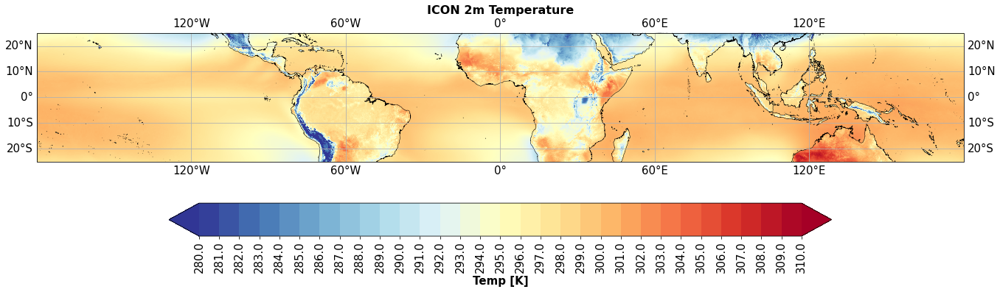

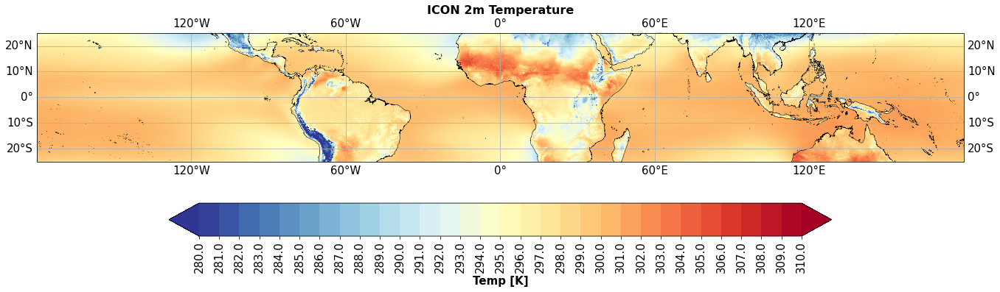

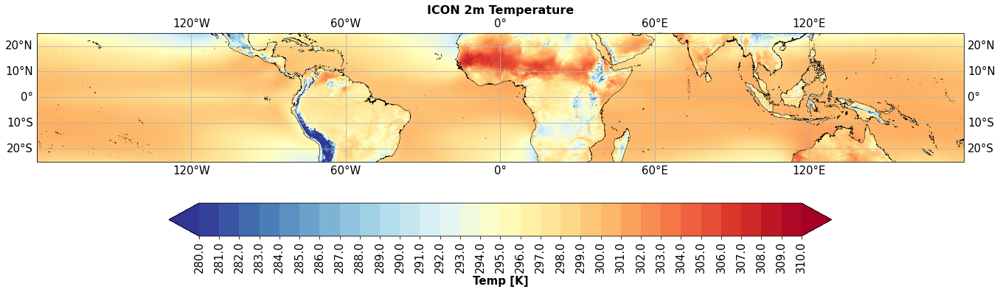

In [ ]:
time_idx = ['2020-01-31T00:00:00.000000000', '2020-02-29T00:00:00.000000000',
       '2020-03-31T00:00:00.000000000'] #,'2020-04-30T00:00:00.000000000']
for i in range(3):   
    contf_tmean(f'ICON 2m Temperature',icon_mon_timavg.sel(time=time_idx[i]),'Temp [K]','RdYlBu_r',280, 310, 31,-30,30,-180,180)

## 2) MODIS

### 2-1) Terra

AttributeError: 'Rectangle' object has no property 'cmap'

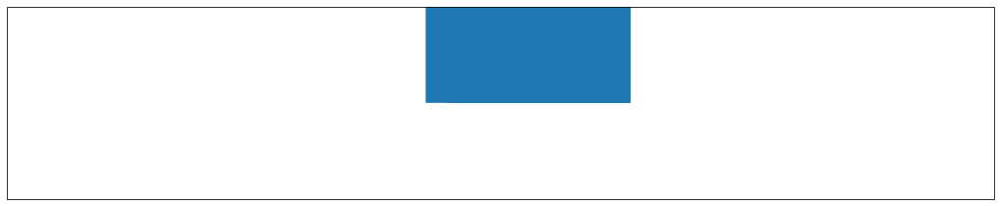

In [ ]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
contf_tmean(f'TERRA Averaged 2m Temperature',modis_mon_avg,'Temp [K]','RdYlBu_r',21, 41, 61,30,-30,-180,180)

### 2-2) Aqua

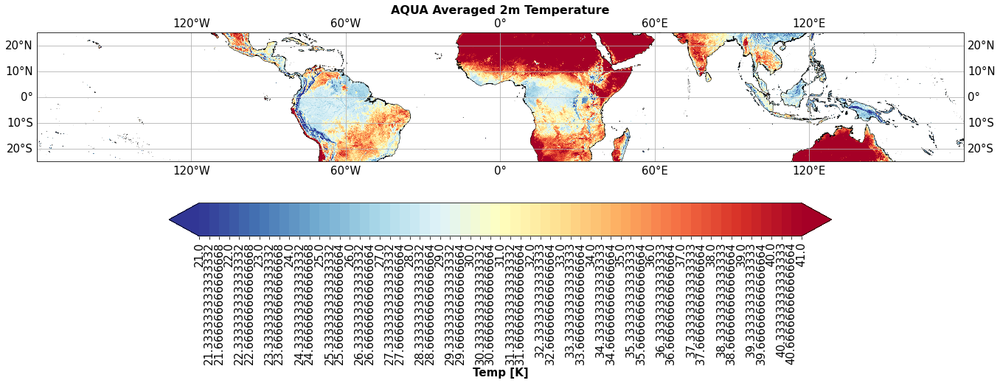

In [ ]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
contf_tmean(f'AQUA Averaged 2m Temperature',aqua_timavg,'Temp [K]','RdYlBu_r',21, 41, 61,-30,30,-180,180)

In [ ]:
modis_mon_avg

<xarray.DataArray (time: 4, lat: 600, lon: 3600)>
dask.array<getitem, shape=(4, 600, 3600), dtype=float32, chunksize=(1, 600, 50), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95
  * time     (time) datetime64[ns] 2020-01-31 2020-02-29 2020-03-31 2020-04-30
  * lon      (lon) float32 -180.0 -179.9 -179.8 -179.6 ... 179.8 179.8 179.9

In [ ]:
modis_mon_avg=modis_mon_avg.reindex(lat=list(reversed(modis_mon_avg.lat)))

In [ ]:
modis_mon_avg_int=modis_mon_avg.interpolate_na(dim="lat", method="cubic", fill_value="extrapolate")

In [ ]:
modis_mon_avg_int=modis_mon_avg_int.chunk(dict(lon=-1))
modis_mon_avg_int=modis_mon_avg_int.interpolate_na(dim="lon", method="cubic", fill_value="extrapolate")

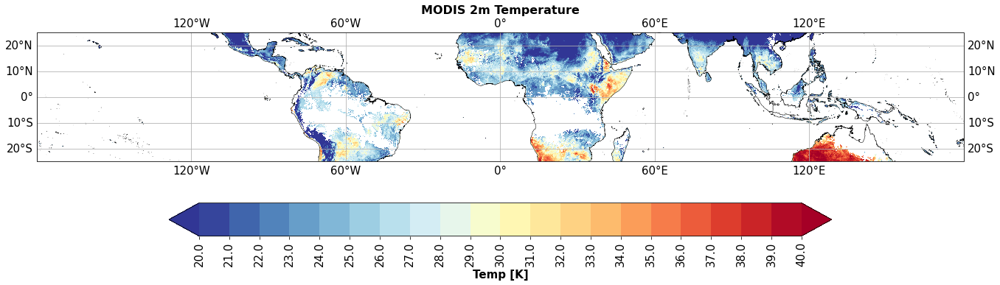

In [ ]:
contf_tmean(f'MODIS 2m Temperature',modis_mon_avg.isel(time=0),'Temp [K]','RdYlBu_r',20, 40, 21,-30,30,-180,180)

In [ ]:
modis_mon_avg_int

<xarray.DataArray (time: 4, lat: 600, lon: 3600)>
dask.array<transpose, shape=(4, 600, 3600), dtype=float32, chunksize=(1, 600, 3600), chunktype=numpy.ndarray>
Coordinates:
  * lat      (lat) float32 -29.95 -29.85 -29.75 -29.65 ... 29.75 29.85 29.95
  * time     (time) datetime64[ns] 2020-01-31 2020-02-29 2020-03-31 2020-04-30
  * lon      (lon) float32 -180.0 -179.9 -179.8 -179.6 ... 179.8 179.8 179.9

ValueError: The number of derivatives at boundaries does not match: expected 1, got 0+0

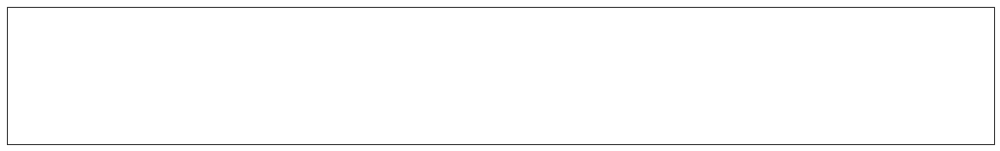

In [ ]:
contf_tmean(f'MODIS 2m Temperature',modis_mon_avg_int.isel(time=0),'Temp [K]','RdYlBu_r',20, 40, 21,-30,30,-180,180)

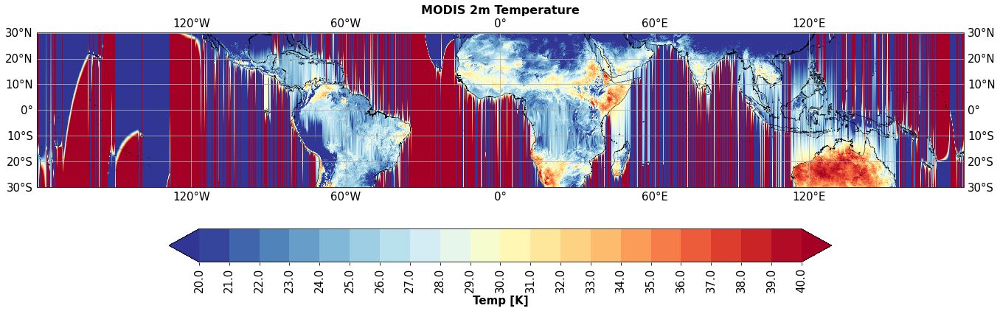

In [ ]:
contf_tmean(f'MODIS 2m Temperature',modis_mon_avg_int.isel(time=1),'Temp [K]','RdYlBu_r',20, 40, 21,25,-25,-180,180)

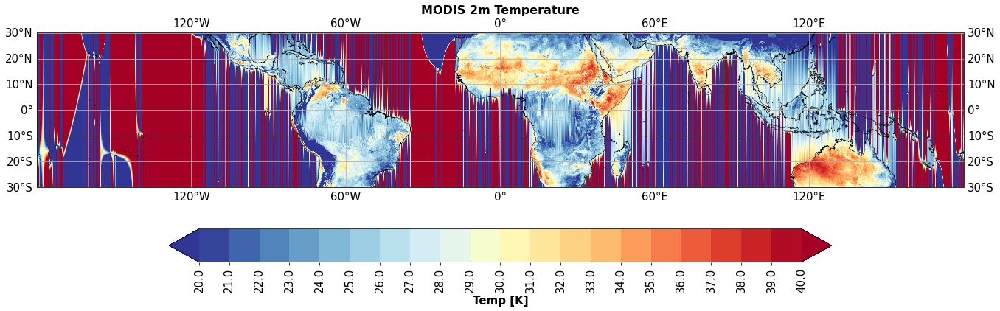

In [ ]:
contf_tmean(f'MODIS 2m Temperature',modis_mon_avg_int.isel(time=2),'Temp [K]','RdYlBu_r',20, 40, 21,25,-25,-180,180)

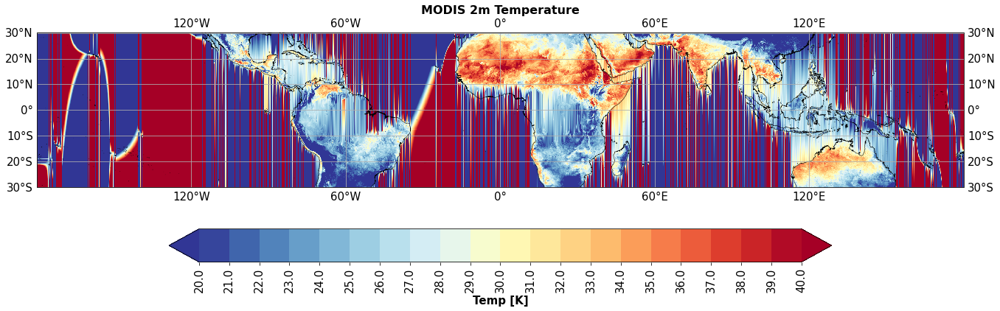

In [ ]:
contf_tmean(f'MODIS 2m Temperature',modis_mon_avg_int.isel(time=3),'Temp [K]','RdYlBu_r',20, 40, 21,25,-25,-180,180)

# Load ERA5 T2m

In [ ]:
file_era5 ='/scratch/m/m300948/ERA5_2020_var167_regrid.nc'
dset_era5 = xr.open_dataset(file_era5) # if it is ncfile

In [ ]:
dset_era5

<xarray.Dataset>
Dimensions:  (time: 366, lon: 1280, lat: 640)
Coordinates:
  * time     (time) float64 2.02e+07 2.02e+07 2.02e+07 ... 2.02e+07 2.02e+07
  * lon      (lon) float64 -180.0 -179.7 -179.4 -179.2 ... 179.2 179.4 179.7
  * lat      (lat) float64 89.78 89.51 89.23 88.95 ... -89.23 -89.51 -89.78
Data variables:
    var167   (time, lat, lon) float32 ...
Attributes:
    CDI:          Climate Data Interface version 2.0.3 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    institution:  European Centre for Medium-Range Weather Forecasts
    history:      Thu Jul 14 10:05:41 2022: cdo sellonlatbox,-180,180,-90,90 ...
    CDO:          Climate Data Operators version 2.0.3 (https://mpimet.mpg.de...

In [ ]:
dset_era5_date=dset_era5.isel(time=slice(19,31+29+31+20)).sel(lat=slice(30,-30))

In [ ]:
date=pd.date_range("2020-01-20", periods=11+29+31+21)

In [ ]:
dset_era5_date['time']=date

In [ ]:
dset_era5_date = dset_era5_date['var167']

## 1) Time average

In [ ]:
era5_mon_timavg = dset_era5_date.resample(time='1M').mean("time")

In [ ]:
era5_mon_timavg=era5_mon_timavg['var167']

KeyError: 'var167'

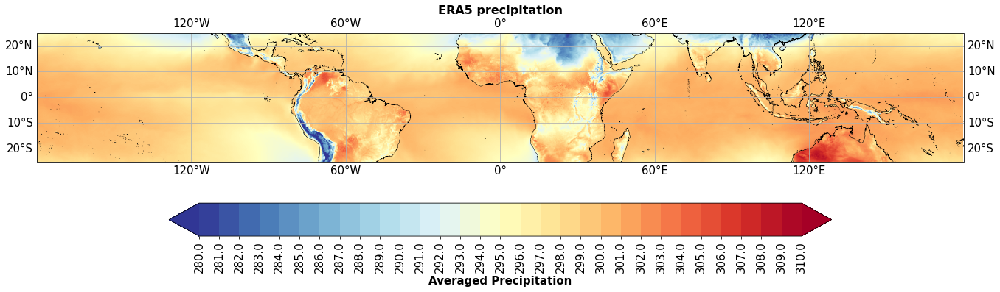

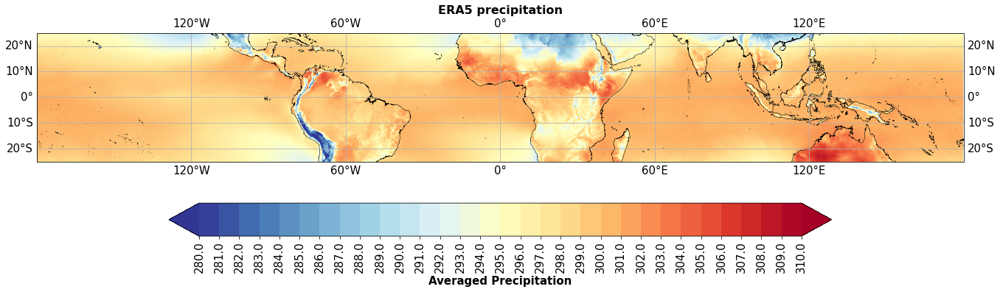

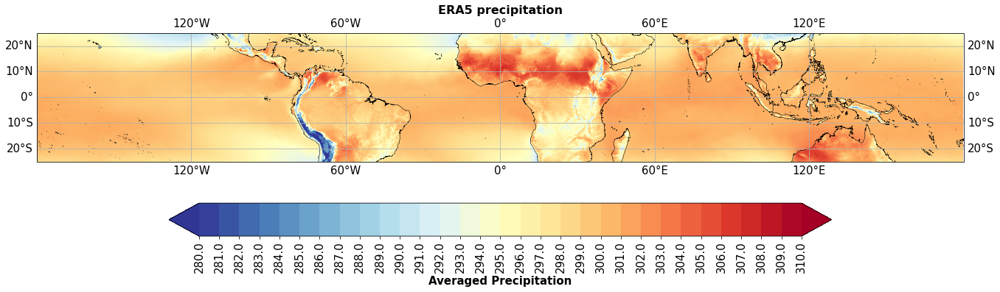

In [ ]:
# title, data, label, colormap, varmin, varmax, space, lat_min, lat_max, lon_min, lon_max
for i in range(3):
    contf_tmean(f'ERA5 precipitation',era5_mon_timavg.isel(time=i),'Averaged Precipitation','RdYlBu_r',280, 310, 31,-30,30,-180,180)

## 2) Spatial average

In [ ]:
era5_trop_spaiavg = dset_era5_date.mean(("lon", "lat"))
era5_amz_spaiavg = dset_era5_date.sel(lon=slice(-65,-55), lat=slice(0,-10)).mean(("lon", "lat"))

In [ ]:
era5_amz_spaiavg

<xarray.DataArray 'var167' (time: 92)>
array([299.40753, 298.91904, 299.2857 , 299.78476, 300.28445, 299.22025,
       299.94797, 300.44067, 299.1583 , 299.61945, 299.887  , 300.08804,
       300.16306, 299.7351 , 299.86047, 299.34485, 299.27805, 299.8144 ,
       299.0149 , 298.96527, 299.29517, 299.95605, 299.24432, 298.9526 ,
       298.95486, 299.18555, 299.52594, 299.84918, 300.01938, 300.62985,
       300.0165 , 299.19516, 298.97433, 299.11267, 299.33072, 299.53134,
       298.81757, 299.4182 , 299.16434, 299.00748, 299.2942 , 299.51596,
       298.80878, 299.24164, 299.72302, 299.3169 , 299.37302, 299.69748,
       299.43628, 299.708  , 299.6685 , 299.9719 , 300.70474, 300.86734,
       299.04602, 298.88922, 299.84714, 299.7214 , 299.24054, 298.2834 ,
       298.28488, 299.53506, 300.28543, 299.03763, 299.0929 , 300.44995,
       300.76642, 299.9371 , 300.06763, 300.11374, 298.948  , 298.86707,
       298.8344 , 299.50217, 299.56998, 299.55496, 300.2618 , 299.71225,
       299.8195 , 299.19522, 298.55084, 299.11493, 298.47858, 298.56644,
       298.54962, 298.1777 , 298.18686, 298.42496, 298.59363, 298.12   ,
       298.32822, 298.64444], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-20 2020-01-21 ... 2020-04-20

/home/m/m300948/.conda/envs/JUPYTER_MODULE/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


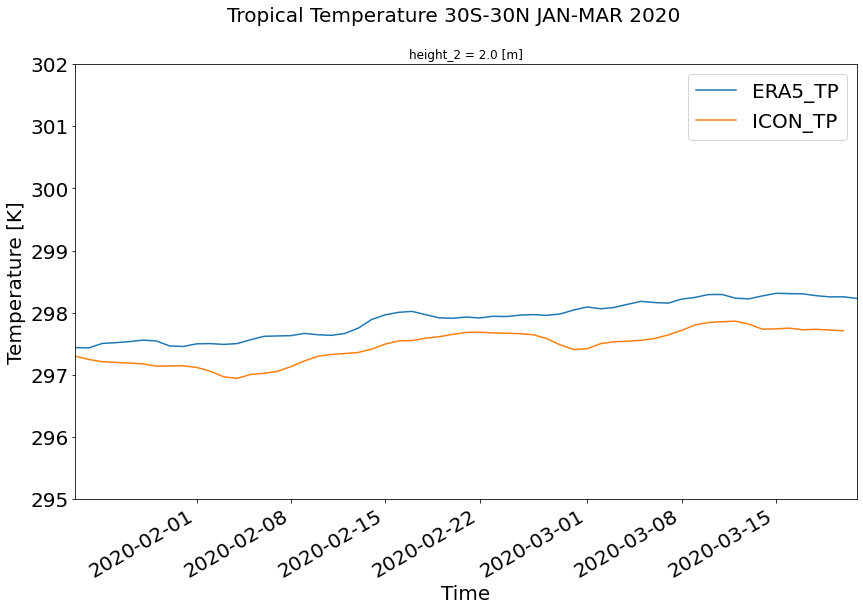

In [ ]:
import datetime
fig = plt.figure(figsize=(14,8))
fig.suptitle('Tropical Temperature 30S-30N JAN-MAR 2020', size=20)
era5_trop_spaiavg[0:].plot.line(label="ERA5_TP")
icon_trop_spaiavg[0:].plot.line(label="ICON_TP")
#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('Temperature [K]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.ylim(295,302)
plt.xlim([datetime.date(2020, 1, 23),datetime.date(2020, 3, 21)])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)

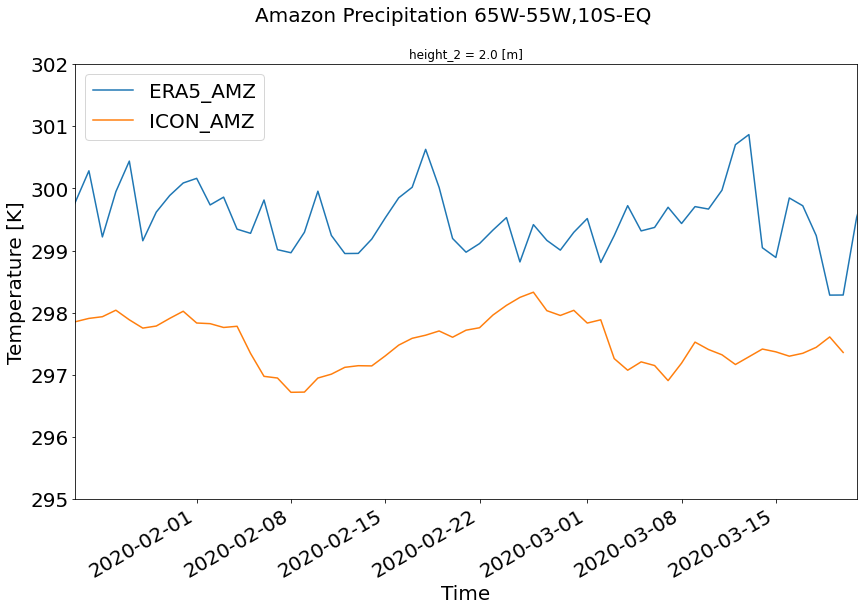

In [ ]:
fig = plt.figure(figsize=(14,8))
fig.suptitle('Amazon Precipitation 65W-55W,10S-EQ', size=20)
era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
icon_amz_spaiavg.plot.line(label="ICON_AMZ")
#era5_amz_spaiavg.plot.line(label="ERA5_AMZ")
#imerge_spaiavg_data.plot.line(label="IMERGE")
plt.ylabel('Temperature [K]',fontsize=20)
plt.xlabel('Time',fontsize=20)
plt.ylim(295,302)
plt.xlim([datetime.date(2020, 1, 23),datetime.date(2020, 3, 21)])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(fontsize=20)